<a href="https://colab.research.google.com/github/JYJJEON/AIFFEL_Online_Quest/blob/main/Exploration/Exploration1/Exploration1rev2(test_accuracy_89_65_).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import warnings
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

warnings.filterwarnings('ignore')

In [2]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/tf_flowers/',
    download=True,
    with_info=True,
    as_supervised=True,
)

In [3]:
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


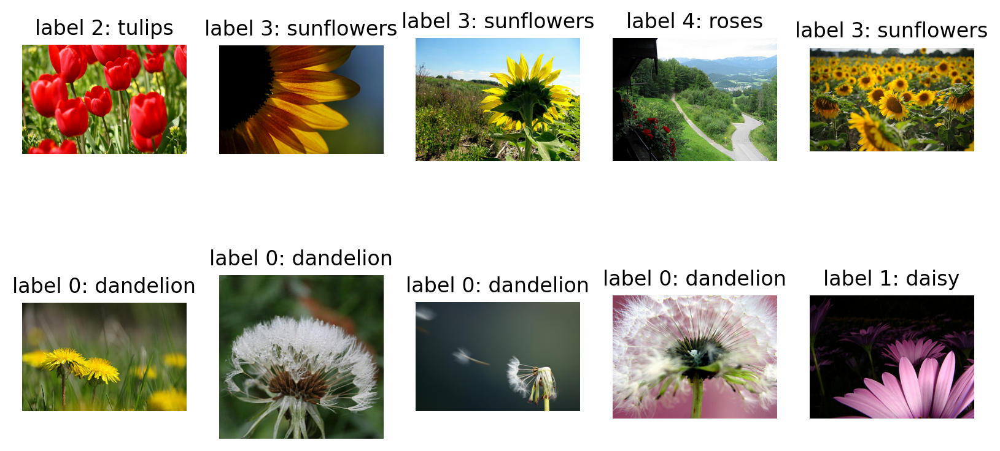

In [4]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [5]:
IMG_SIZE = 224 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [6]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


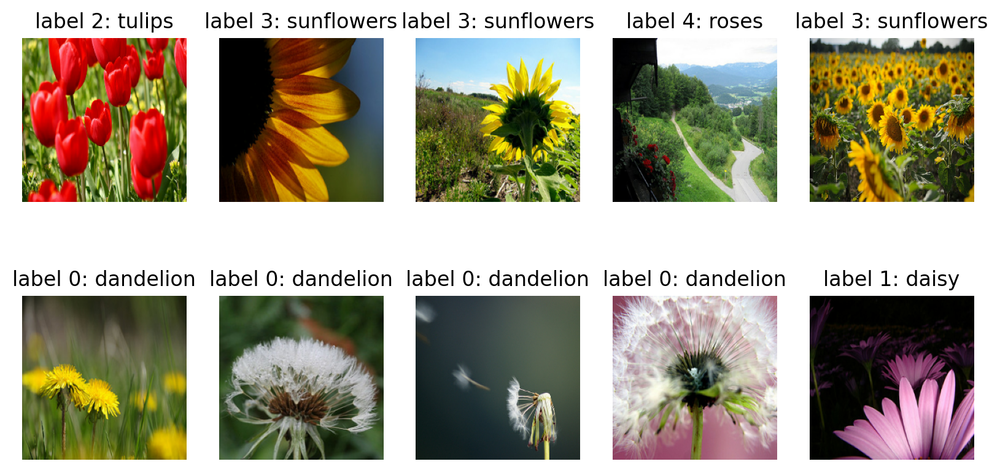

In [7]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [8]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [9]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32]))

In [22]:
def build_model(num_classes):
    inputs = tf.keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = inputs
    model = tf.keras.applications.VGG16(include_top=False, input_tensor=x, weights="imagenet")

    # Freeze the pretrained weights
    model.trainable = False

    # Rebuild top
    x = tf.keras.layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
    x = tf.keras.layers.BatchNormalization()(x)
    outputs = tf.keras.layers.Dense(num_classes, activation="softmax", name="pred")(x)

    # Compile
    model = tf.keras.Model(inputs, outputs, name="VGG16")
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
    model.compile(
        optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )
    return model

In [23]:
model = build_model(num_classes=5)

In [24]:
model.summary()

Model: "EfficientNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)      

In [28]:
EPOCHS = 50
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data = validation_batches)

Epoch 1/50
92/92 [==============================] - 13s 143ms/step - loss: 0.2397 - accuracy: 0.9213 - val_loss: 0.4173 - val_accuracy: 0.8447
Epoch 2/50
92/92 [==============================] - 14s 147ms/step - loss: 0.2371 - accuracy: 0.9230 - val_loss: 0.4169 - val_accuracy: 0.8447
Epoch 3/50
92/92 [==============================] - 13s 142ms/step - loss: 0.2384 - accuracy: 0.9230 - val_loss: 0.4165 - val_accuracy: 0.8501
Epoch 4/50
92/92 [==============================] - 13s 139ms/step - loss: 0.2381 - accuracy: 0.9227 - val_loss: 0.4174 - val_accuracy: 0.8474
Epoch 5/50
92/92 [==============================] - 13s 138ms/step - loss: 0.2243 - accuracy: 0.9305 - val_loss: 0.4174 - val_accuracy: 0.8474
Epoch 6/50
92/92 [==============================] - 13s 138ms/step - loss: 0.2339 - accuracy: 0.9230 - val_loss: 0.4165 - val_accuracy: 0.8501
Epoch 7/50
92/92 [==============================] - 13s 139ms/step - loss: 0.2248 - accuracy: 0.9271 - val_loss: 0.4169 - val_accuracy: 0.8447

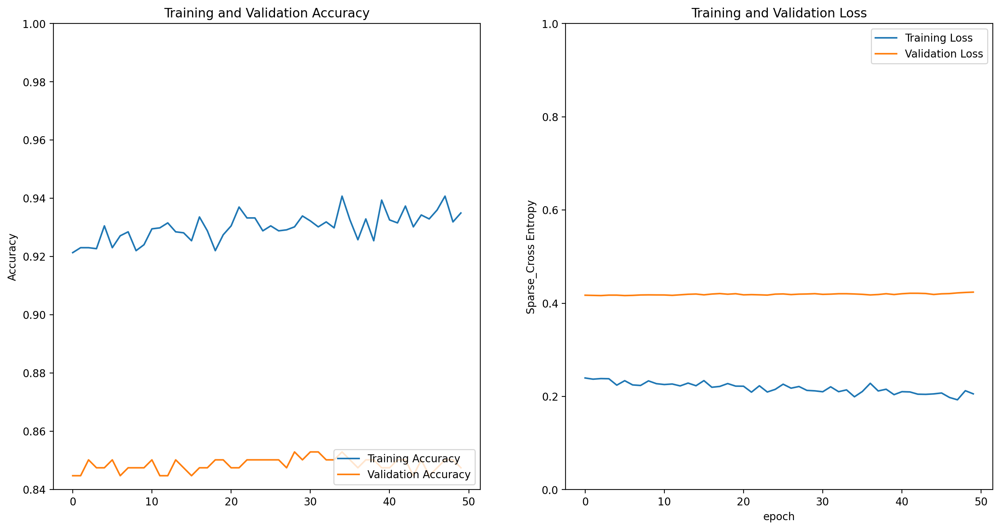

In [29]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Sparse_Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [30]:
for image_batch, label_batch in test_batches.take(3):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 0s 35ms/step


array([[9.98095214e-01, 8.34872364e-04, 7.01930912e-05, 9.65512299e-04,
        3.41336745e-05],
       [4.15064365e-04, 8.88034344e-01, 9.68613625e-02, 9.51447431e-03,
        5.17472858e-03],
       [1.44342368e-06, 1.82133335e-05, 3.30768031e-04, 9.99193728e-01,
        4.55879548e-04],
       [3.13769357e-04, 1.06515099e-05, 9.98209834e-01, 5.62638743e-04,
        9.03143547e-04],
       [8.01015290e-07, 1.65452541e-08, 2.88712476e-09, 9.99999166e-01,
        4.41709835e-10],
       [7.41295636e-01, 2.21895170e-03, 6.28036857e-02, 1.93203866e-01,
        4.77878231e-04],
       [2.84858252e-05, 5.16679393e-06, 9.98847246e-01, 7.50588470e-06,
        1.11154560e-03],
       [2.08707410e-04, 3.95732038e-02, 9.16570306e-01, 9.74751078e-03,
        3.39002609e-02],
       [2.59350830e-09, 3.51628951e-05, 1.72012374e-02, 3.62570368e-04,
        9.82400954e-01],
       [4.22908086e-03, 2.43278244e-03, 9.07246232e-01, 2.25129668e-02,
        6.35790303e-02],
       [9.99943733e-01, 1.3926

In [31]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 3, 2, 3, 0, 2, 2, 4, 2, 0, 3, 1, 2, 4, 0, 4, 4, 1, 4, 0, 3,
       2, 2, 4, 1, 2, 0, 1, 1, 3, 3])

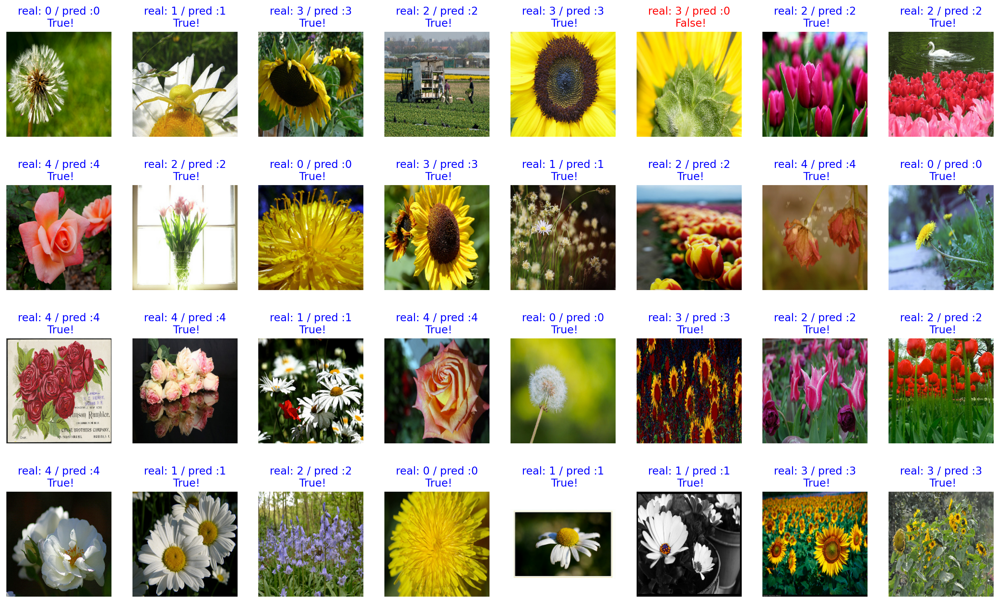

In [32]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [33]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 96% 내외

96.875


In [34]:
import os

checkpoint_dir = "C:\\Users\\james\\tf_flowers\\checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')

model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [35]:
# Initialize variables to hold predictions and labels
all_predictions = []
all_labels = []

# Loop over each batch of data
for image_batch, label_batch in test_batches:
    # Make predictions
    predictions = model.predict(image_batch)
    all_predictions.append(predictions)
    all_labels.append(label_batch.numpy())

# Concatenate all the predictions and labels into single arrays
all_predictions = np.concatenate(all_predictions, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

# Convert probabilities to integer labels
predicted_labels = np.argmax(all_predictions, axis=1)

# Your labels are already integers
true_labels = all_labels

# Calculate accuracy
accuracy = np.mean(predicted_labels == true_labels)
print(f'Test accuracy: {accuracy * 100:.2f}%')


1/1 [==============================] - 0s 156ms/step
Test accuracy: 89.65%
